#### Required Libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import models, transforms
import matplotlib
import matplotlib.pyplot as plt
import time
import os
import copy
import random
from datetime import datetime
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
from torchsummary import summary

from data_helper import UnlabeledDataset, LabeledDataset
from helper import collate_fn, draw_box, compute_ts_road_map
from modelzoo import *

#### VAE Model Summary

In [2]:
model = vae()
inp = torch.rand([3,6,3,256,306])
model.summarize(inp)

Class: vae
Passed Input Size:torch.Size([3, 6, 3, 256, 306])
----
     Class: encoder
     resnet_style: 18, pretrained: False
     Passed Input Size:torch.Size([3, 3, 256, 306])
     Output Size:torch.Size([3, 512, 8, 8])
----
Number of encoded states: 6, each of size: torch.Size([3, 512, 8, 8])
Concatenated encoded states shape: torch.Size([3, 3072, 8, 8])
----
     Class: encoder_after_resnet
     Passed Input Size:torch.Size([3, 3072, 8, 8])
     Convolved Encoded state shape: torch.Size([3, 512, 4, 4])
     Output Mean Size:torch.Size([3, 4096])
     Output Var Size:torch.Size([3, 4096])
----
Output Mean Size:torch.Size([3, 4096])
Output Var Size:torch.Size([3, 4096])
Reparameterized Hidden State size: torch.Size([3, 4096])
----
     Class: vae_decoder
     Passed Input Size:torch.Size([3, 4096])
     Input recast into shape: torch.Size([3, 64, 8, 8])
     Output Size:torch.Size([3, 800, 800])
----
Output Size:torch.Size([3, 800, 800])


#### AE Model Summary

In [3]:
model = autoencoder()
inp = torch.rand([3,6,3,256,306])
model.summarize(inp)

Class: autoencoder
Passed Input Size:torch.Size([3, 6, 3, 256, 306])
----
     Class: encoder
     resnet_style: 18, pretrained: False
     Passed Input Size:torch.Size([3, 3, 256, 306])
     Output Size:torch.Size([3, 512, 8, 8])
----
Number of encoded states: 6, each of size: torch.Size([3, 512, 8, 8])
Concatenated Hidden State size: torch.Size([3, 3072, 8, 8])
----
     Class: decoder
     Passed Input Size:torch.Size([3, 3072, 8, 8])
     Output Size:torch.Size([3, 800, 800])
----
Output Size:torch.Size([3, 800, 800])


### Setting project details

In [4]:
matplotlib.rcParams['figure.figsize'] = [5, 5]
matplotlib.rcParams['figure.dpi'] = 200

seed = 8964
torch.backends.cudnn.benchmark = True
# torch.backends.cudnn.deterministic = True
np.random.seed(seed)
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

transform = torchvision.transforms.ToTensor()

image_folder = '../data'
annotation_csv = '../data/annotation.csv'

labeled_scene_index = np.arange(106, 134)

start_index = 106
end_index = 134

V1 = (21,5,2)
V2 = (26,1,1)
V3 = (25,3,0)

n_train_samples , n_val_samples , n_test_samples = V3

assert n_train_samples + n_val_samples + n_test_samples == 28 #No of labeled samples


train_labeled_scene_index = np.arange(start_index, start_index+n_train_samples)
val_labeled_scene_index = np.arange(start_index+n_train_samples,start_index+n_train_samples+n_val_samples)
test_labeled_scene_index = np.arange(start_index+n_train_samples+n_val_samples, end_index)

train_labeled_set = LabeledDataset(image_folder=image_folder,
                                  annotation_file=annotation_csv,
                                  scene_index=train_labeled_scene_index,
                                  transform=transform,
                                  extra_info=True
                                 )

val_labeled_set = LabeledDataset(image_folder=image_folder,
                                  annotation_file=annotation_csv,
                                  scene_index=val_labeled_scene_index,
                                  transform=transform,
                                  extra_info=True
                                 )

if n_test_samples != 0:

    test_labeled_set = LabeledDataset(image_folder=image_folder,
                                      annotation_file=annotation_csv,
                                      scene_index=test_labeled_scene_index,
                                      transform=transform,
                                      extra_info=True
                                     )
else:
    
    test_labeled_set = None

In [5]:
def prepare_experiment(model_tag, batch_size = 16, resnet_style = '18', weights ='random', model_type ='ae', checkpoint_folder = '/scratch/sc6957/dlproject/checkpoints/'):

    train_loader = torch.utils.data.DataLoader(train_labeled_set, batch_size=batch_size, shuffle=True, num_workers=4, collate_fn=collate_fn)
    val_loader = torch.utils.data.DataLoader(val_labeled_set, batch_size=batch_size, shuffle=True, num_workers=4, collate_fn=collate_fn)
    if test_labeled_set is not None:
        test_loader = torch.utils.data.DataLoader(test_labeled_set, batch_size=1, shuffle=True, num_workers=4, collate_fn=collate_fn)
    else:
        test_loader = None
    dataloaders = {'train': train_loader, 'val': val_loader, 'test': test_loader}

    if weights == 'random':
        pretrained = False
    elif weights == 'imagenet':
        pretrained = True
    elif weights == 'ssl':
        pretrained = False

    print('Model Type: {0}'.format(model_type))

    if model_type == 'ae':
        model = autoencoder(resnet_style=resnet_style, pretrained=pretrained)
    elif model_type == 'vae':
        model = mmd_vae()

    sample_input = torch.rand([3,6,3,256,306])
    print('{} Model Summary'.format(model_type))
    model.summarize(sample_input)

    model = model.to(device)

    optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=0.0001)
    scheduler = lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.97)
    criterion = nn.BCELoss()

    today = datetime.now().date()
    
    checkpoint_tag = '{0}-{1}{2}'.format(today.day,today.month, model_tag)
    checkpoint_path = checkpoint_folder + 'checkpoint_{0}.pth.tar'.format(checkpoint_tag)
    best_checkpoint_path = checkpoint_folder + 'checkpoint_{0}_best.pth.tar'.format(checkpoint_tag)

    return model, optimizer, scheduler, criterion, dataloaders, checkpoint_path, best_checkpoint_path

#### Training and Validation

In [6]:
def train(num_epochs, model, model_type, model_tag, optimizer, scheduler, criterion, restore, threshold, dataloaders, checkpoint_path, best_checkpoint_path, tensorboard_log_dir):

    if restore:
        print('Checking to restore...')
        if os.path.isfile(checkpoint_path):
            print('Restoring checkpoint from {}'.format(checkpoint_path))
            state = torch.load(checkpoint_path)
            epoch = state['epoch']
            best_loss = state['best_loss']
            best_ts = state['best_ts']
            model.load_state_dict(state['state_dict'])
            optimizer.load_state_dict(state['optimizer'])
            scheduler.load_state_dict(state['scheduler'])
        else:
            print('No checkpoint found at {}'.format(checkpoint_path))
            epoch = 0
            best_loss = np.inf
            best_ts = 0
    else:
        print('Not checking to restore')
        epoch = 0
        best_loss = np.inf
        best_ts = 0
            
    writer = SummaryWriter(log_dir=tensorboard_log_dir, comment=model_tag)

    while epoch < num_epochs:
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()  # Set model to evaluate mode

            running_loss = 0.0
            threat_score = 0.0

            # Iterate over data.
            for i, temp_batch in tqdm(enumerate(dataloaders[phase])):
                samples, targets, road_images, extras  = temp_batch
                samples = torch.stack(samples).to(device)
                road_images = torch.stack(road_images).to(device)
                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    if model_type == 'ae':
                        pred_maps = model(samples)
                        loss = criterion(pred_maps, road_images.float())
                    elif model_type == 'vae':
                        z, pred_maps = model(samples)
                        true_samples = torch.randn(dataloaders[phase].batch_size, z.shape[1]).to(device)
                        mmd = mmd_loss_function(true_samples, z)
                        nll = (pred_maps - road_images.float()).pow(2).mean()
                        loss = nll + mmd

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                    else:
                        for pred_map,road_image in zip(pred_maps,road_images):
                            ts_road_map = compute_ts_road_map(pred_map > threshold, road_image)
                            threat_score += ts_road_map

                running_loss += loss.item()#*batch_size

                # tensorboard logging
                if phase == 'train':
                    writer.add_scalar(phase+'_loss', loss.item(), epoch * len(train_labeled_set) / dataloaders[phase].batch_size + i)
                    if model_type == 'vae':
                        writer.add_scalar(phase+'_loss_nll', nll.item(), epoch * len(train_labeled_set) / dataloaders[phase].batch_size + i)
                        writer.add_scalar(phase+'_loss_mmd', mmd.item(), epoch * len(train_labeled_set) / dataloaders[phase].batch_size + i)

                # statistics
            if phase == 'train':
                running_loss = running_loss / len(train_labeled_set) # per batch, per sample
                print(phase, 'running_loss:', round(running_loss,4))
                writer.add_scalar(phase+'_total_loss', running_loss, epoch)
            else:
                running_loss = running_loss / len(val_labeled_set)
                print(phase,'running_loss:', round(running_loss,4), 'cumulative_threat_score:', round(threat_score.item(),4), \
                      'val_len:',len(val_labeled_set), '\n mean_threat_score:',round(threat_score.item() / len(val_labeled_set),4))#, iou / len(val_set))
                writer.add_scalar(phase+'_ts', threat_score.item()/len(val_labeled_set), epoch)
                writer.add_scalar(phase+'_total_loss', running_loss, epoch)

        # Saving best loss model so far
        if running_loss < best_loss:
            best_loss = running_loss
            torch.save({
                'epoch': epoch + 1,
                'state_dict': model.state_dict(),
                'optimizer': optimizer.state_dict(),
                'scheduler': scheduler.state_dict(),
                'best_loss': best_loss,
                'best_ts': best_ts
                }, best_checkpoint_path)
            print('best_loss model after %d epoch saved...' % (epoch+1))

        # Saving best ts model so far
        if threat_score > best_ts:
            best_ts = threat_score
            torch.save({
                'epoch': epoch + 1,
                'state_dict': model.state_dict(),
                'optimizer': optimizer.state_dict(),
                'scheduler': scheduler.state_dict(),
                'best_loss': best_loss,
                'best_ts': best_ts
                }, best_checkpoint_path)
            print('best_ts model after %d epoch saved...' % (epoch+1))

        # save model per epoch
        torch.save({
            'epoch': epoch + 1,
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            'scheduler': scheduler.state_dict(),
            'best_loss': best_loss,
            'best_ts': best_ts
            }, checkpoint_path)
        print('model after %d epoch saved...' % (epoch+1))
        epoch += 1

    writer.close()

### Running Experiment

**Get Parameters**

In [7]:
checkpoint_folder = '/scratch/sc6957/dlproject/checkpoints/'
tensorboard_log_dir = '/scratch/sc6957/dlproject/tb_logs'

batch_size = 16
resnet_style = '18'
weights = 'random'
model_type ='vae'
num_epochs = 40
threshold = 0.5
restore = True # Restore from checkpoint, if checkpoint exists

model_tag = '_Batch:{}_Model:{}'.format(batch_size,model_type+resnet_style+weights)
if test_labeled_set is None:
    model_tag += '_dataV3_leakyrelu'
print('model_tag:{}'.format(model_tag))
    
parameters = prepare_experiment(model_tag = model_tag, batch_size = batch_size, resnet_style = resnet_style, weights = weights, model_type = model_type, checkpoint_folder = checkpoint_folder)

model, optimizer, scheduler, criterion, dataloaders, checkpoint_path, best_checkpoint_path = parameters   

model_tag:_Batch:16_Model:vae18random_dataV3_leakyrelu
Model Type: vae
vae Model Summary
Class: mmd_vae
Passed Input Size:torch.Size([3, 6, 3, 256, 306])
----
     Class: encoder
     resnet_style: 18, pretrained: False
     Passed Input Size:torch.Size([3, 3, 256, 306])
     Output Size:torch.Size([3, 512, 8, 8])
----
Number of encoded states: 6, each of size: torch.Size([3, 512, 8, 8])
Concatenated encoded states shape: torch.Size([3, 3072, 8, 8])
----
     Class: mmd_encoder_after_resnet
     Passed Input Size:torch.Size([3, 3072, 8, 8])
     Convolved Encoded state shape: torch.Size([3, 512, 4, 4])
     Output Size:torch.Size([3, 8192])
----
Hidden State size: torch.Size([3, 8192])
----
     Class: mmd_decoder
     Passed Input Size:torch.Size([3, 8192])
     Input recast into shape: torch.Size([3, 128, 8, 8])
     Output Size:torch.Size([3, 800, 800])
----
Output Size:torch.Size([3, 800, 800])


**Train**

In [8]:
train(num_epochs, model, model_type, model_tag, optimizer, scheduler,  criterion, restore, threshold, dataloaders, checkpoint_path, best_checkpoint_path, tensorboard_log_dir)

Checking to restore...
No checkpoint found at /scratch/sc6957/dlproject/checkpoints/checkpoint_1-5_Batch:16_Model:vae18random_dataV3_leakyrelu.pth.tar
Epoch 0/39
----------


/scratch/sc6957/miniconda3/envs/capstone/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:100: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule.See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)
197it [02:04,  1.58it/s]

train running_loss: 0.0063



24it [00:13,  1.84it/s]


val running_loss: 0.0061 cumulative_threat_score: 289.1377 val_len: 378 
 mean_threat_score: 0.7649
best_loss model after 1 epoch saved...
best_ts model after 1 epoch saved...
model after 1 epoch saved...
Epoch 1/39
----------


197it [01:59,  1.65it/s]

train running_loss: 0.0035



24it [00:11,  2.07it/s]


val running_loss: 0.0058 cumulative_threat_score: 291.7167 val_len: 378 
 mean_threat_score: 0.7717
best_loss model after 2 epoch saved...
best_ts model after 2 epoch saved...
model after 2 epoch saved...
Epoch 2/39
----------


197it [01:59,  1.65it/s]

train running_loss: 0.0024



24it [00:11,  2.06it/s]


val running_loss: 0.005 cumulative_threat_score: 304.8248 val_len: 378 
 mean_threat_score: 0.8064
best_loss model after 3 epoch saved...
best_ts model after 3 epoch saved...
model after 3 epoch saved...
Epoch 3/39
----------


197it [01:58,  1.66it/s]

train running_loss: 0.0018



24it [00:12,  1.95it/s]


val running_loss: 0.005 cumulative_threat_score: 305.6416 val_len: 378 
 mean_threat_score: 0.8086
best_ts model after 4 epoch saved...
model after 4 epoch saved...
Epoch 4/39
----------


197it [01:59,  1.64it/s]

train running_loss: 0.0014



24it [00:12,  2.00it/s]


val running_loss: 0.005 cumulative_threat_score: 306.338 val_len: 378 
 mean_threat_score: 0.8104
best_ts model after 5 epoch saved...
model after 5 epoch saved...
Epoch 5/39
----------


197it [01:59,  1.65it/s]

train running_loss: 0.0013



24it [00:11,  2.02it/s]


val running_loss: 0.0048 cumulative_threat_score: 308.749 val_len: 378 
 mean_threat_score: 0.8168
best_loss model after 6 epoch saved...
best_ts model after 6 epoch saved...
model after 6 epoch saved...
Epoch 6/39
----------


197it [02:00,  1.64it/s]

train running_loss: 0.0011



24it [00:11,  2.01it/s]


val running_loss: 0.0051 cumulative_threat_score: 304.4009 val_len: 378 
 mean_threat_score: 0.8053
model after 7 epoch saved...
Epoch 7/39
----------


197it [01:59,  1.65it/s]


train running_loss: 0.0011


24it [00:12,  1.94it/s]


val running_loss: 0.0049 cumulative_threat_score: 307.3594 val_len: 378 
 mean_threat_score: 0.8131
model after 8 epoch saved...
Epoch 8/39
----------


197it [01:59,  1.65it/s]

train running_loss: 0.001



24it [00:12,  1.99it/s]


val running_loss: 0.0047 cumulative_threat_score: 311.6916 val_len: 378 
 mean_threat_score: 0.8246
best_loss model after 9 epoch saved...
best_ts model after 9 epoch saved...
model after 9 epoch saved...
Epoch 9/39
----------


197it [02:00,  1.64it/s]

train running_loss: 0.001



24it [00:12,  1.97it/s]


val running_loss: 0.0051 cumulative_threat_score: 304.3179 val_len: 378 
 mean_threat_score: 0.8051
model after 10 epoch saved...
Epoch 10/39
----------


197it [02:00,  1.63it/s]

train running_loss: 0.0009



24it [00:12,  1.99it/s]


val running_loss: 0.0044 cumulative_threat_score: 313.3658 val_len: 378 
 mean_threat_score: 0.829
best_loss model after 11 epoch saved...
best_ts model after 11 epoch saved...
model after 11 epoch saved...
Epoch 11/39
----------


197it [01:59,  1.64it/s]

train running_loss: 0.0009



24it [00:12,  1.99it/s]


val running_loss: 0.0046 cumulative_threat_score: 310.9446 val_len: 378 
 mean_threat_score: 0.8226
model after 12 epoch saved...
Epoch 12/39
----------


197it [01:59,  1.64it/s]

train running_loss: 0.0009



24it [00:12,  1.99it/s]


val running_loss: 0.0045 cumulative_threat_score: 312.3489 val_len: 378 
 mean_threat_score: 0.8263
model after 13 epoch saved...
Epoch 13/39
----------


197it [01:59,  1.64it/s]

train running_loss: 0.0008



24it [00:12,  2.00it/s]


val running_loss: 0.0044 cumulative_threat_score: 313.8271 val_len: 378 
 mean_threat_score: 0.8302
best_loss model after 15 epoch saved...
best_ts model after 15 epoch saved...
model after 15 epoch saved...
Epoch 15/39
----------


197it [02:00,  1.63it/s]

train running_loss: 0.0008



24it [00:12,  1.88it/s]


val running_loss: 0.0046 cumulative_threat_score: 311.2877 val_len: 378 
 mean_threat_score: 0.8235
model after 16 epoch saved...
Epoch 16/39
----------


197it [01:59,  1.64it/s]

train running_loss: 0.0008



24it [00:13,  1.80it/s]


val running_loss: 0.0045 cumulative_threat_score: 314.2779 val_len: 378 
 mean_threat_score: 0.8314
best_ts model after 17 epoch saved...
model after 17 epoch saved...
Epoch 17/39
----------


197it [02:00,  1.64it/s]

train running_loss: 0.0007



24it [00:12,  1.97it/s]


val running_loss: 0.0044 cumulative_threat_score: 315.3011 val_len: 378 
 mean_threat_score: 0.8341
best_loss model after 18 epoch saved...
best_ts model after 18 epoch saved...
model after 18 epoch saved...
Epoch 18/39
----------


197it [02:00,  1.63it/s]

train running_loss: 0.0007



24it [00:12,  1.97it/s]


val running_loss: 0.0044 cumulative_threat_score: 314.275 val_len: 378 
 mean_threat_score: 0.8314
model after 19 epoch saved...
Epoch 19/39
----------


197it [02:02,  1.61it/s]

train running_loss: 0.0007



24it [00:12,  1.99it/s]


val running_loss: 0.0046 cumulative_threat_score: 311.2108 val_len: 378 
 mean_threat_score: 0.8233
model after 20 epoch saved...
Epoch 20/39
----------


197it [02:00,  1.64it/s]

train running_loss: 0.0007



24it [00:12,  1.92it/s]


val running_loss: 0.0039 cumulative_threat_score: 320.631 val_len: 378 
 mean_threat_score: 0.8482
best_loss model after 21 epoch saved...
best_ts model after 21 epoch saved...
model after 21 epoch saved...
Epoch 21/39
----------


197it [02:00,  1.64it/s]

train running_loss: 0.0007



24it [00:12,  1.99it/s]


val running_loss: 0.0042 cumulative_threat_score: 317.1236 val_len: 378 
 mean_threat_score: 0.839
model after 22 epoch saved...
Epoch 22/39
----------


197it [01:59,  1.64it/s]

train running_loss: 0.0007



24it [00:12,  2.00it/s]


val running_loss: 0.0044 cumulative_threat_score: 314.214 val_len: 378 
 mean_threat_score: 0.8313
model after 23 epoch saved...
Epoch 23/39
----------


197it [02:00,  1.64it/s]

train running_loss: 0.0006



24it [00:11,  2.01it/s]


val running_loss: 0.0042 cumulative_threat_score: 317.0288 val_len: 378 
 mean_threat_score: 0.8387
model after 24 epoch saved...
Epoch 24/39
----------


197it [02:00,  1.63it/s]

train running_loss: 0.0006



24it [00:13,  1.80it/s]


val running_loss: 0.0046 cumulative_threat_score: 312.5819 val_len: 378 
 mean_threat_score: 0.8269
model after 25 epoch saved...
Epoch 25/39
----------


197it [02:00,  1.63it/s]

train running_loss: 0.0006



24it [00:12,  1.93it/s]


val running_loss: 0.0041 cumulative_threat_score: 317.8063 val_len: 378 
 mean_threat_score: 0.8408
model after 26 epoch saved...
Epoch 26/39
----------


197it [02:01,  1.62it/s]

train running_loss: 0.0006



24it [00:12,  2.00it/s]


val running_loss: 0.0044 cumulative_threat_score: 315.5174 val_len: 378 
 mean_threat_score: 0.8347
model after 27 epoch saved...
Epoch 27/39
----------


197it [02:01,  1.62it/s]

train running_loss: 0.0006



24it [00:12,  1.99it/s]


val running_loss: 0.0043 cumulative_threat_score: 315.7174 val_len: 378 
 mean_threat_score: 0.8352
model after 28 epoch saved...
Epoch 28/39
----------


197it [02:02,  1.60it/s]


train running_loss: 0.0006


24it [00:14,  1.66it/s]


val running_loss: 0.0044 cumulative_threat_score: 314.8309 val_len: 378 
 mean_threat_score: 0.8329
model after 29 epoch saved...
Epoch 29/39
----------


197it [02:01,  1.63it/s]

train running_loss: 0.0005



24it [00:12,  1.96it/s]


val running_loss: 0.0043 cumulative_threat_score: 316.7849 val_len: 378 
 mean_threat_score: 0.8381
model after 30 epoch saved...
Epoch 30/39
----------


197it [02:00,  1.63it/s]

train running_loss: 0.0005



24it [00:12,  1.99it/s]


val running_loss: 0.0049 cumulative_threat_score: 309.5643 val_len: 378 
 mean_threat_score: 0.819
model after 31 epoch saved...
Epoch 31/39
----------


197it [02:01,  1.62it/s]

train running_loss: 0.0005



24it [00:12,  1.97it/s]


val running_loss: 0.0044 cumulative_threat_score: 316.167 val_len: 378 
 mean_threat_score: 0.8364
model after 32 epoch saved...
Epoch 32/39
----------


197it [02:01,  1.62it/s]

train running_loss: 0.0005



24it [00:13,  1.81it/s]


val running_loss: 0.0045 cumulative_threat_score: 313.9774 val_len: 378 
 mean_threat_score: 0.8306
model after 33 epoch saved...
Epoch 33/39
----------


197it [02:00,  1.64it/s]

train running_loss: 0.0005



24it [00:12,  1.95it/s]


val running_loss: 0.0048 cumulative_threat_score: 311.4662 val_len: 378 
 mean_threat_score: 0.824
model after 34 epoch saved...
Epoch 34/39
----------


197it [02:01,  1.62it/s]

train running_loss: 0.0005



24it [00:12,  1.97it/s]


val running_loss: 0.0047 cumulative_threat_score: 312.2951 val_len: 378 
 mean_threat_score: 0.8262
model after 35 epoch saved...
Epoch 35/39
----------


197it [02:00,  1.63it/s]

train running_loss: 0.0005



24it [00:11,  2.02it/s]


val running_loss: 0.0044 cumulative_threat_score: 315.0825 val_len: 378 
 mean_threat_score: 0.8336
model after 36 epoch saved...
Epoch 36/39
----------


197it [02:01,  1.62it/s]


train running_loss: 0.0004


24it [00:12,  1.96it/s]


val running_loss: 0.0041 cumulative_threat_score: 318.3178 val_len: 378 
 mean_threat_score: 0.8421
model after 37 epoch saved...
Epoch 37/39
----------


197it [02:00,  1.64it/s]

train running_loss: 0.0004



24it [00:12,  1.91it/s]


val running_loss: 0.0045 cumulative_threat_score: 313.9612 val_len: 378 
 mean_threat_score: 0.8306
model after 38 epoch saved...
Epoch 38/39
----------


197it [02:00,  1.63it/s]

train running_loss: 0.0004



24it [00:12,  1.98it/s]


val running_loss: 0.0044 cumulative_threat_score: 315.5639 val_len: 378 
 mean_threat_score: 0.8348
model after 39 epoch saved...
Epoch 39/39
----------


197it [02:02,  1.61it/s]

train running_loss: 0.0004



24it [00:12,  1.96it/s]


val running_loss: 0.0042 cumulative_threat_score: 316.8635 val_len: 378 
 mean_threat_score: 0.8383
model after 40 epoch saved...


In [9]:
best_checkpoint_path

'/scratch/sc6957/dlproject/checkpoints/checkpoint_1-5_Batch:16_Model:vae18random_dataV3_leakyrelu_best.pth.tar'

### Evaluation & Analysis

In [10]:
def evaluate(model, model_type, model_path, dataloaders, phase, display_images = False, n_batch_to_display = 3, threshold = 0.5):
    
    assert phase != 'unlabeled'
    
    print('Estimating performance on {} set'.format(phase))
    print('Restoring Best checkpoint from {}'.format(model_path))
    state = torch.load(model_path)
    epoch = state['epoch']
    model.load_state_dict(state['state_dict'])
    
    model.eval()

    threat_score = 0.0
    total = 0.0
    
    for i, temp_batch in enumerate(dataloaders[phase]):
        if display_images and i == n_batch_to_display:
            break
        total += len(temp_batch[0])
        samples, targets, road_images, extra = temp_batch
        samples = torch.stack(samples).to(device)
        road_images = torch.stack(road_images).to(device)
        if model_type == 'ae':
            pred_maps = model(samples)
        elif model_type == 'vae':
            z, pred_maps = model(samples)

        for pred_map,road_image in zip(pred_maps,road_images):
            ts_road_map = compute_ts_road_map(pred_map > threshold, road_image)
            threat_score += ts_road_map

        if display_images:
            for sample,pred_map,road_image in zip(samples,pred_maps,road_images):
                print('Test Batch: {}'.format(i))
                # CAM_FRONT_LEFT, CAM_FRONT, CAM_FRONT_RIGHT, CAM_BACK_LEFT, CAM_BACK, CAM_BACK_RIGHT
                plt.imshow(torchvision.utils.make_grid(sample.detach().cpu(), nrow=3).numpy().transpose(1, 2, 0))
                fig, (ax1, ax2) = plt.subplots(1, 2)
                fig.suptitle('Road Map Comparison')
                ax1.imshow(road_image.detach().cpu(), cmap='binary');
                ax1.set_title('Original Road Map')
                ax2.imshow((pred_map > threshold).detach().cpu(), cmap='binary');
                ax2.set_title('Predicted Road Map')
                plt.show()
                print('-'*20)

    threat_score /= total
    print('Total samples: {}, Total Threat Score: {}'.format(total,total*threat_score))
    print('Mean Threat Score is: {}'.format(threat_score))

### Verifying Performance on Test (Val & Train) set

In [11]:
# evaluate(model, model_type, best_checkpoint_path, dataloaders,  'test', display_images = True , n_batch_to_display = 10, threshold = 0.5)
evaluate(model, model_type, best_checkpoint_path, dataloaders,  'val', display_images = False , n_batch_to_display = 1, threshold = 0.5)
# evaluate(model, model_type, best_checkpoint_path, dataloaders,  'train', display_images = True , n_batch_to_display = 1, threshold = 0.5)

Estimating performance on val set
Restoring Best checkpoint from /scratch/sc6957/dlproject/checkpoints/checkpoint_1-5_Batch:16_Model:vae18random_dataV3_leakyrelu_best.pth.tar
Total samples: 378.0, Total Threat Score: 320.6309509277344
Mean Threat Score is: 0.8482300043106079


Estimating performance on val set
Restoring Best checkpoint from /scratch/sc6957/dlproject/checkpoints/checkpoint_1-5_Batch:16_Model:vae18random_dataV3_leakyrelu_best.pth.tar
Test Batch: 0


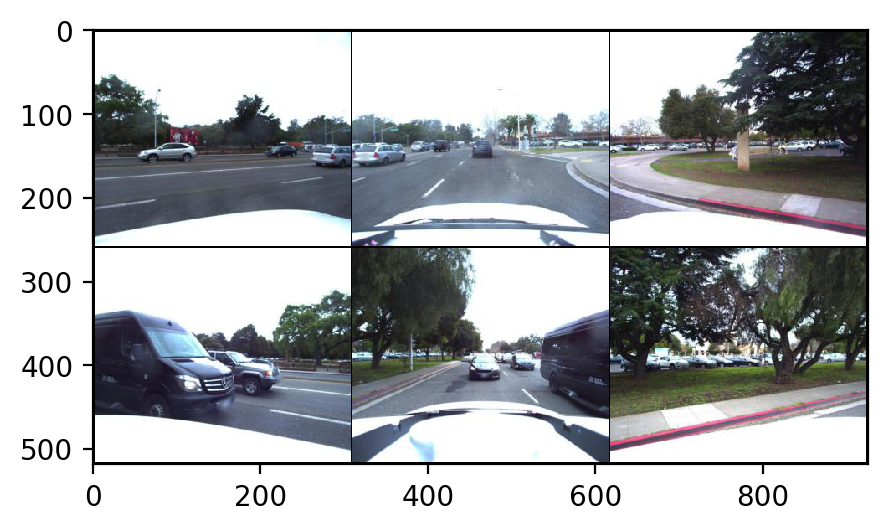

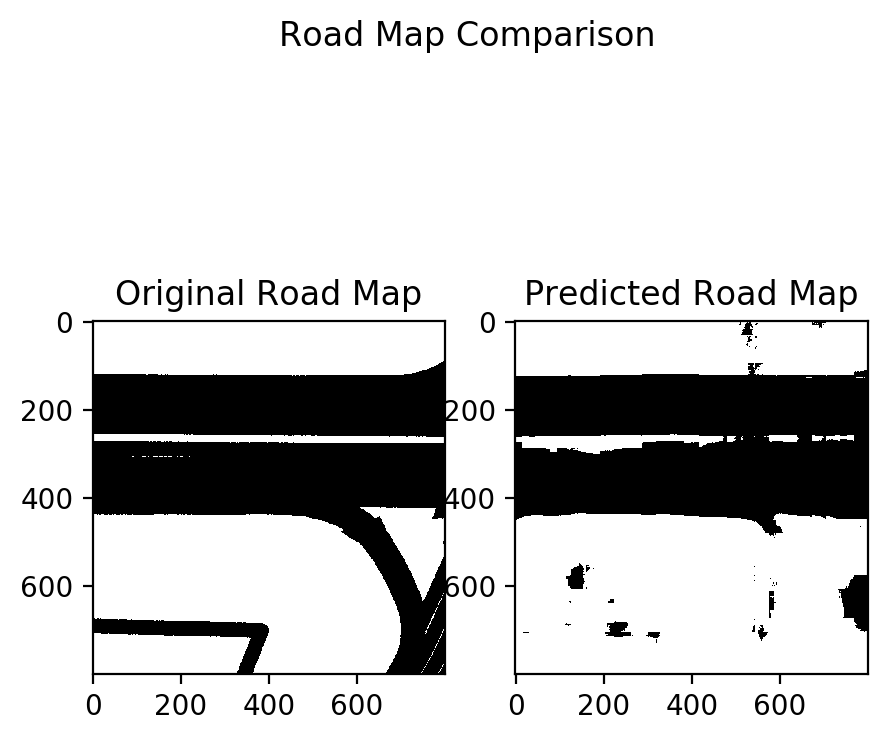

--------------------
Test Batch: 0


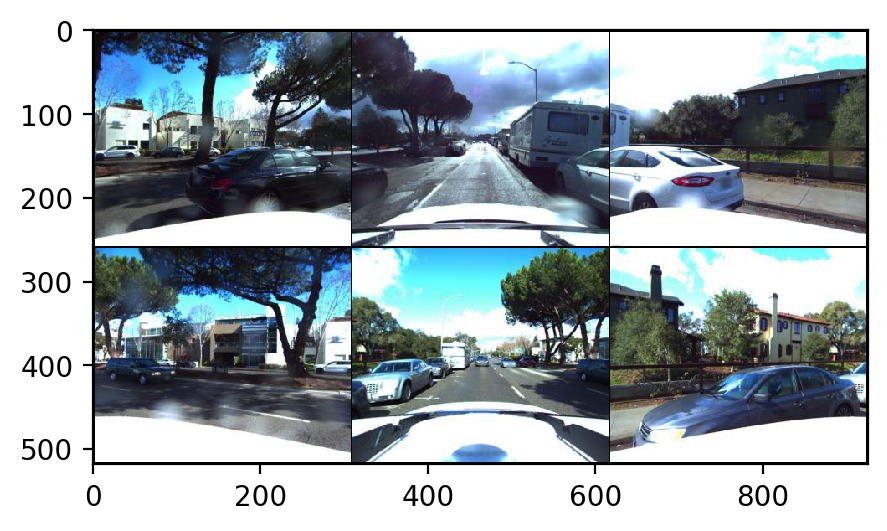

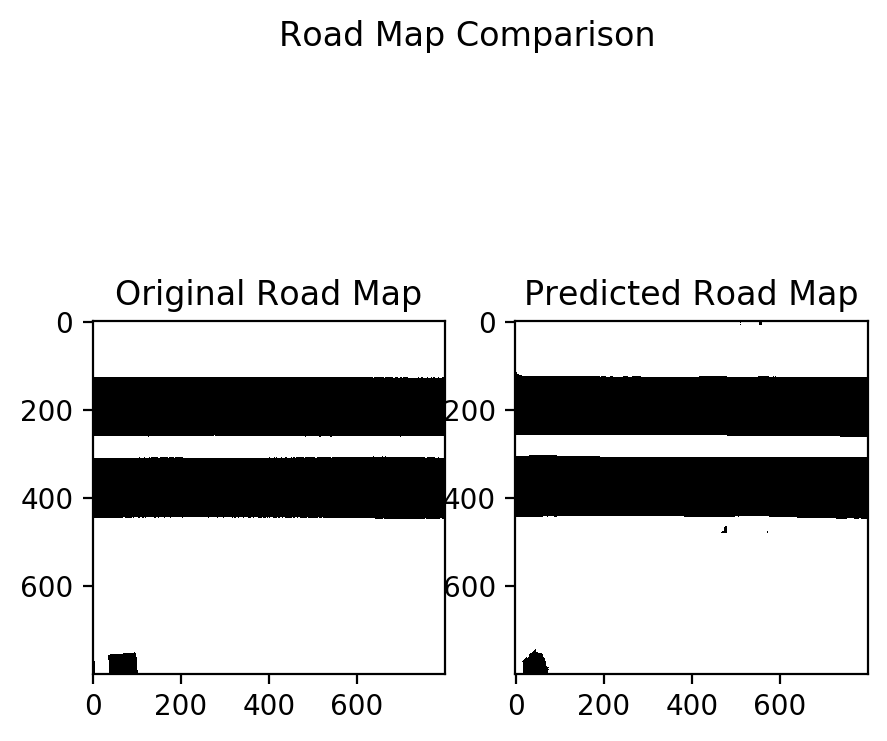

--------------------
Test Batch: 0


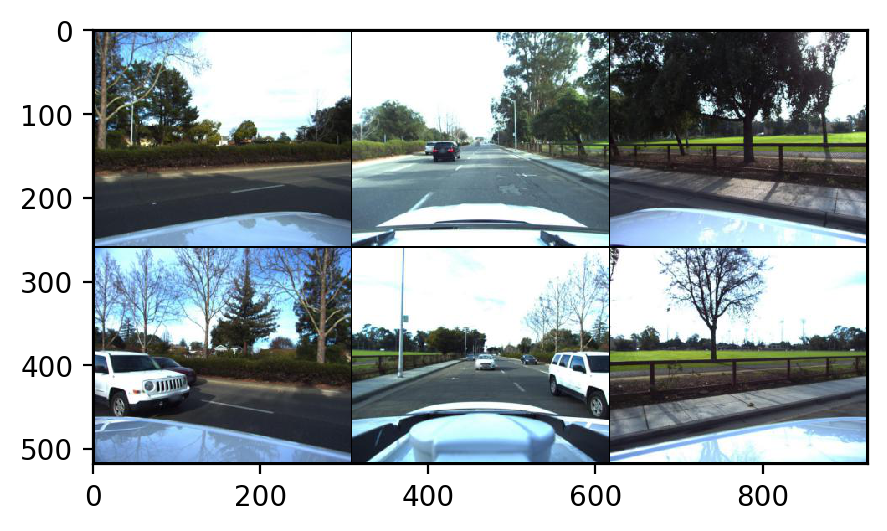

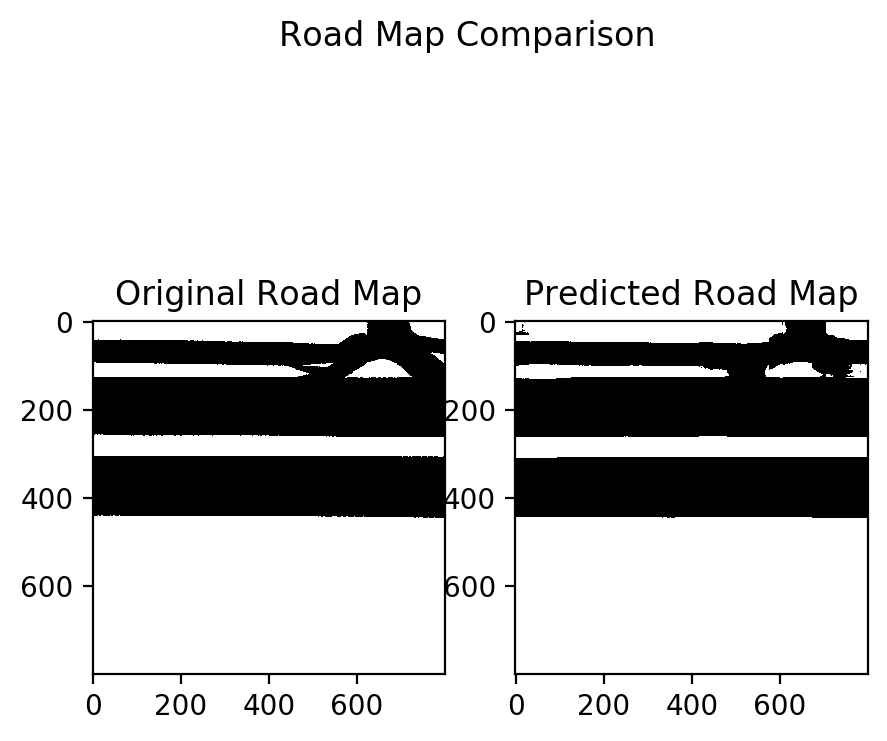

--------------------
Test Batch: 0


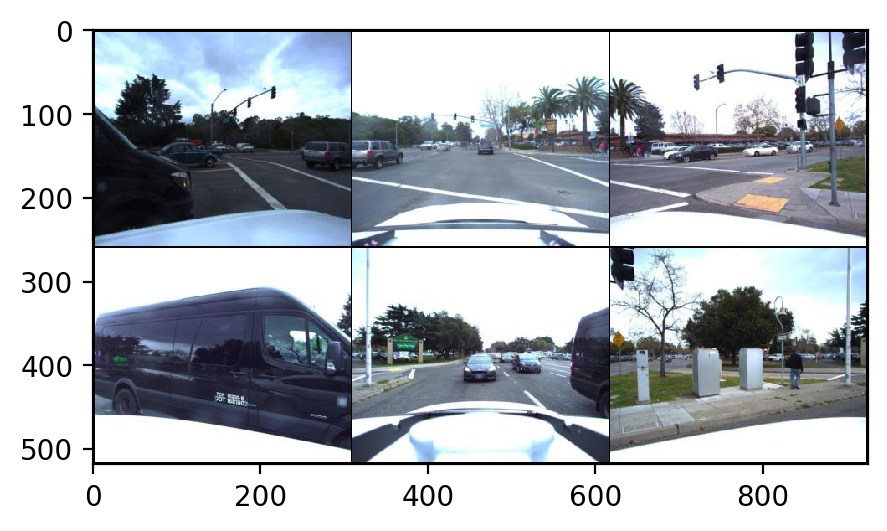

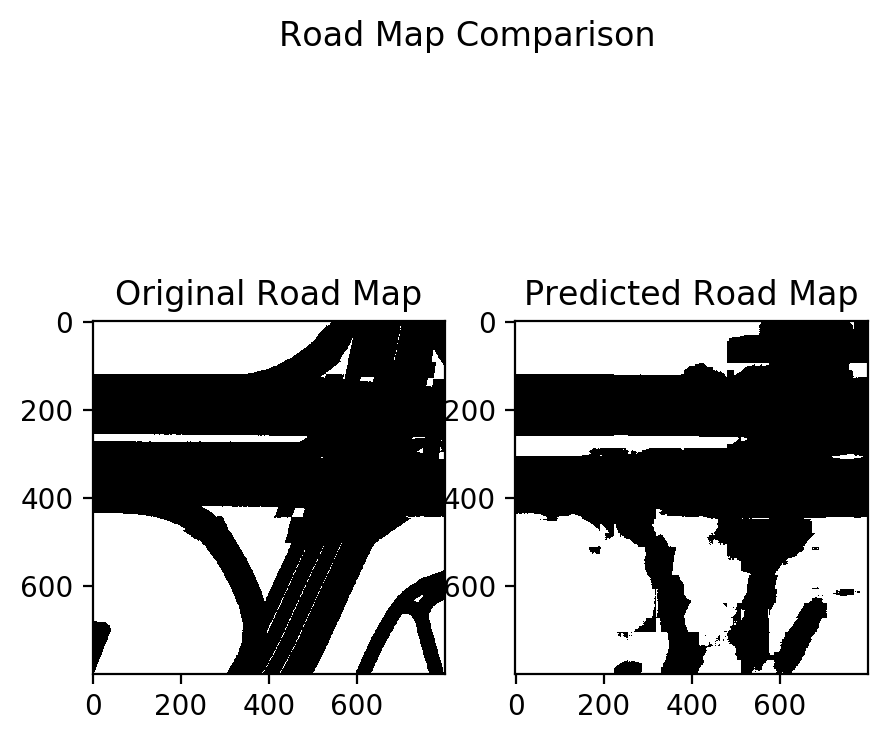

--------------------
Test Batch: 0


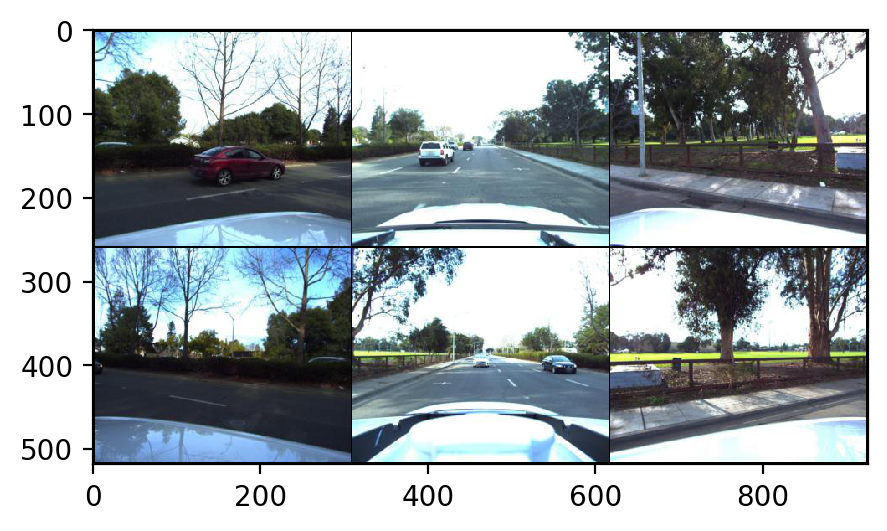

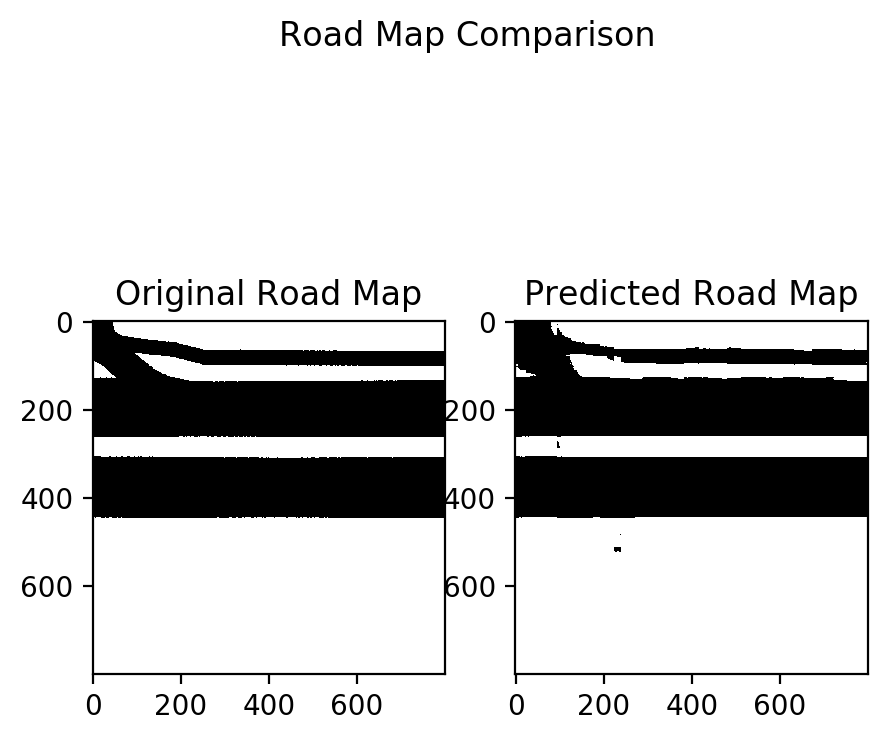

--------------------
Test Batch: 0


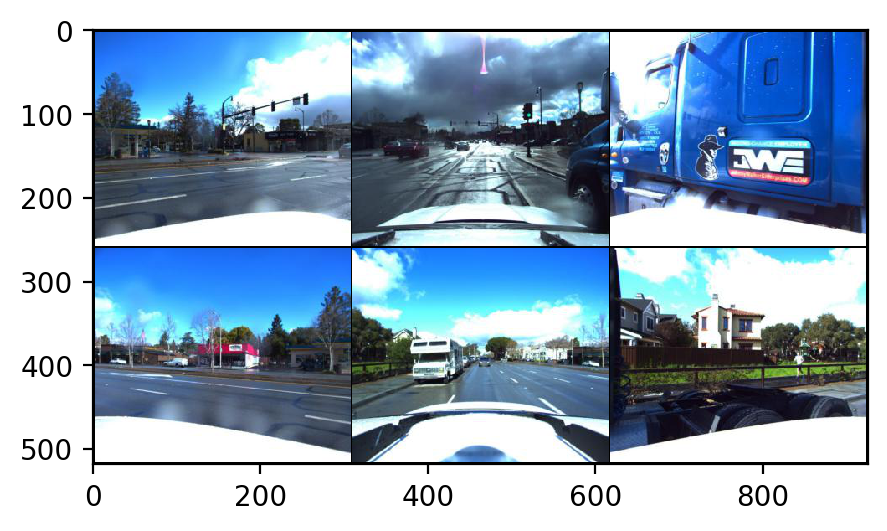

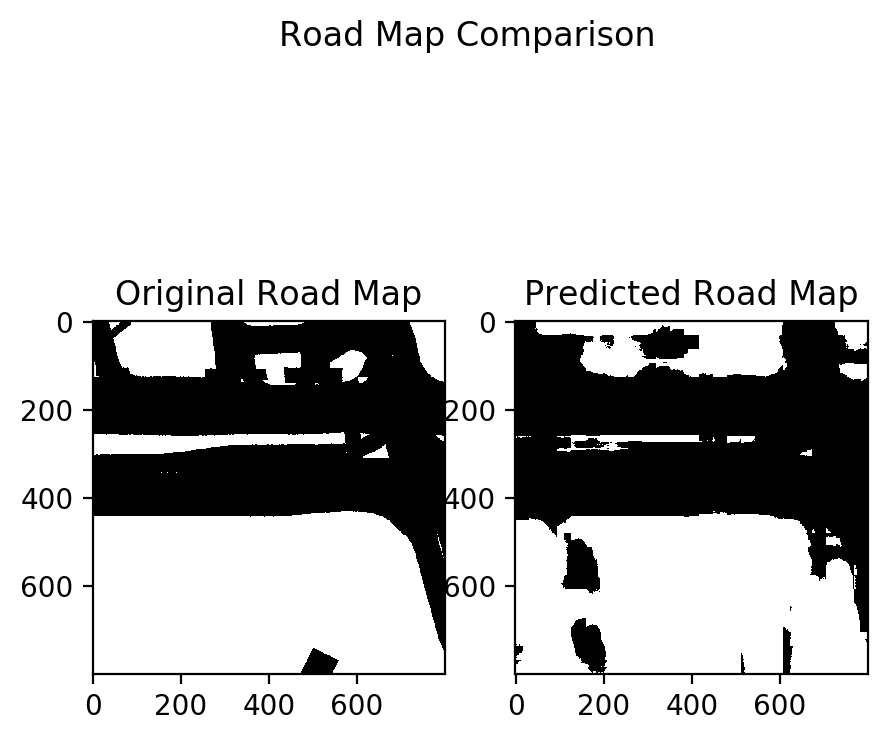

--------------------
Test Batch: 0


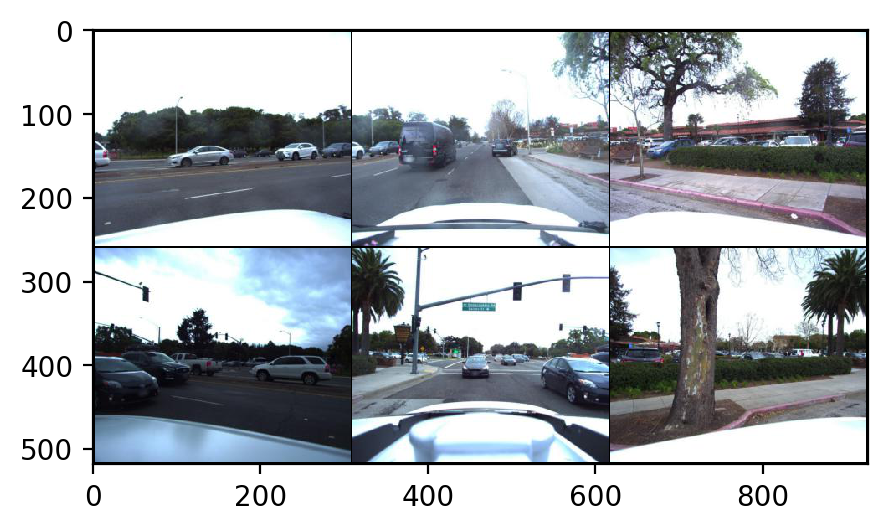

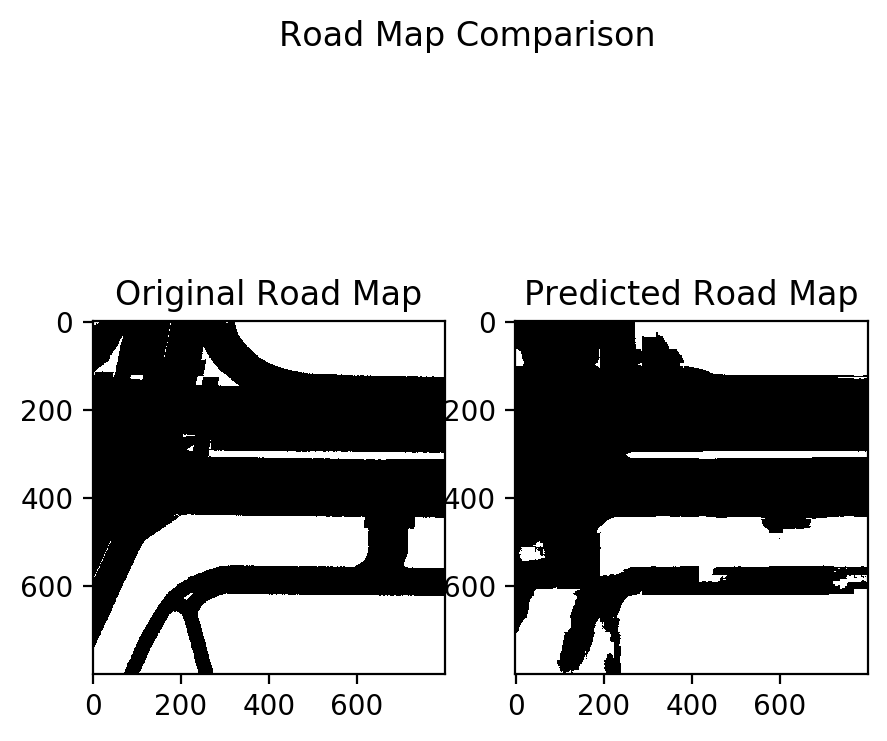

--------------------
Test Batch: 0


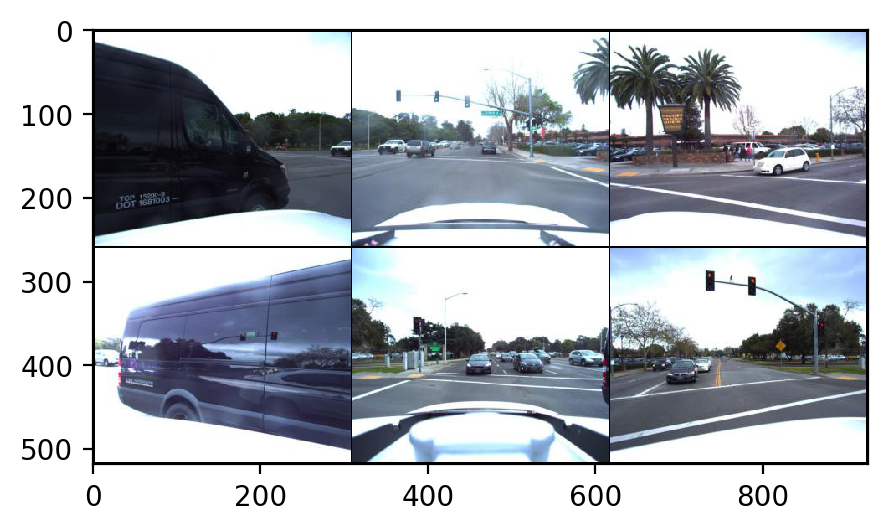

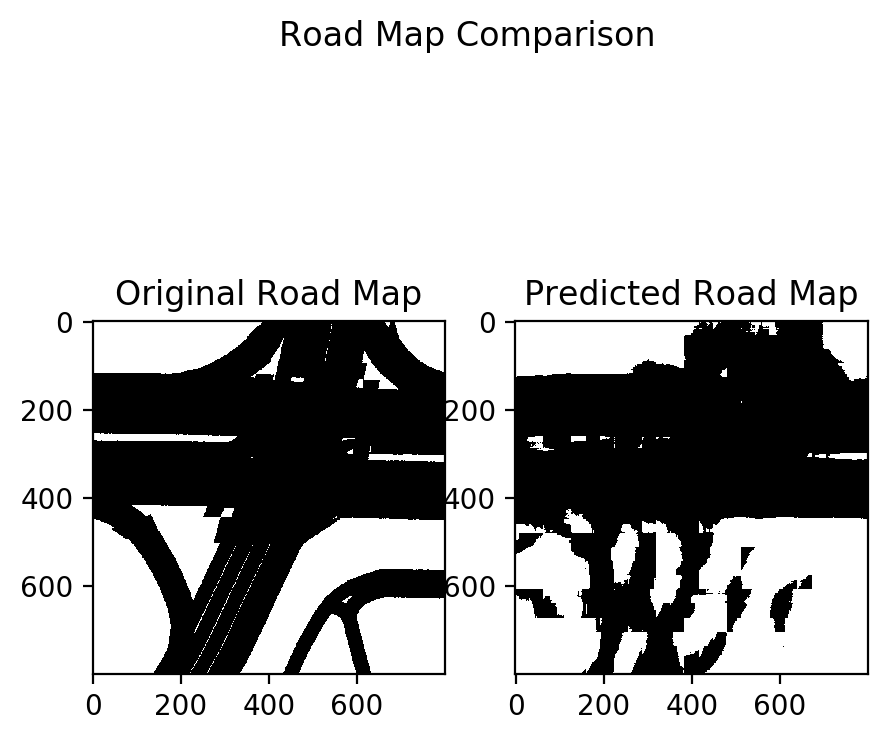

--------------------
Test Batch: 0


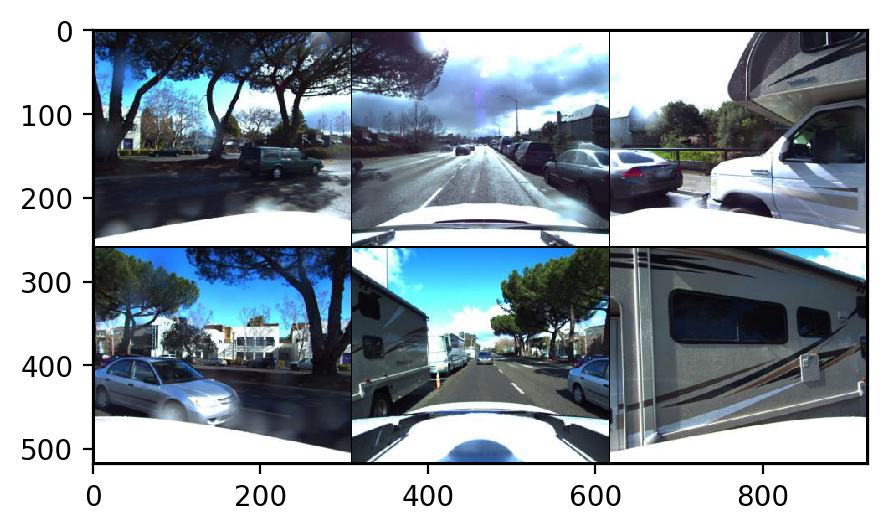

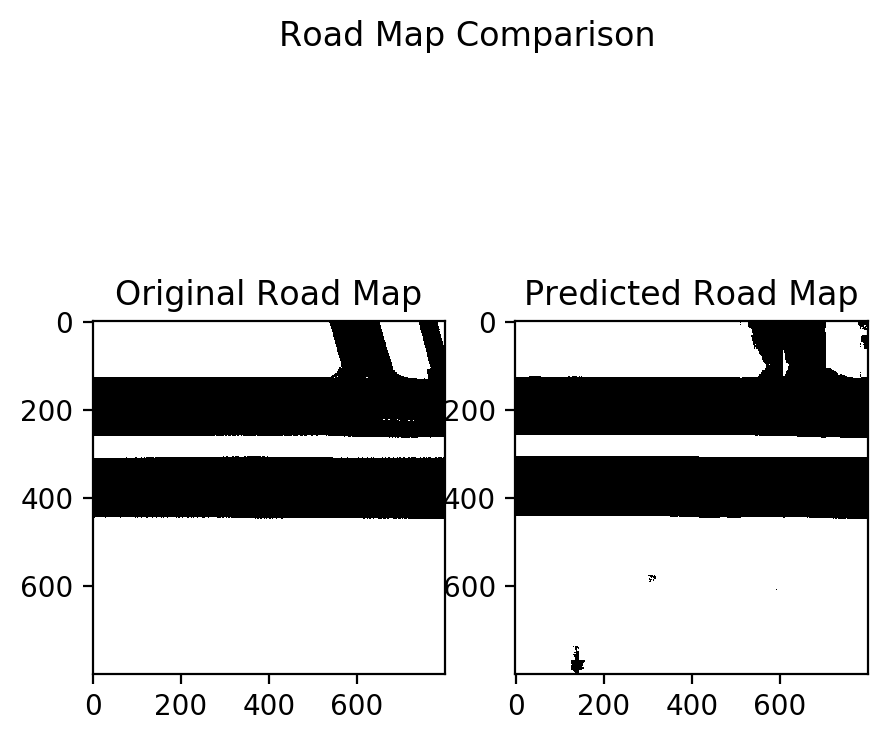

--------------------
Test Batch: 0


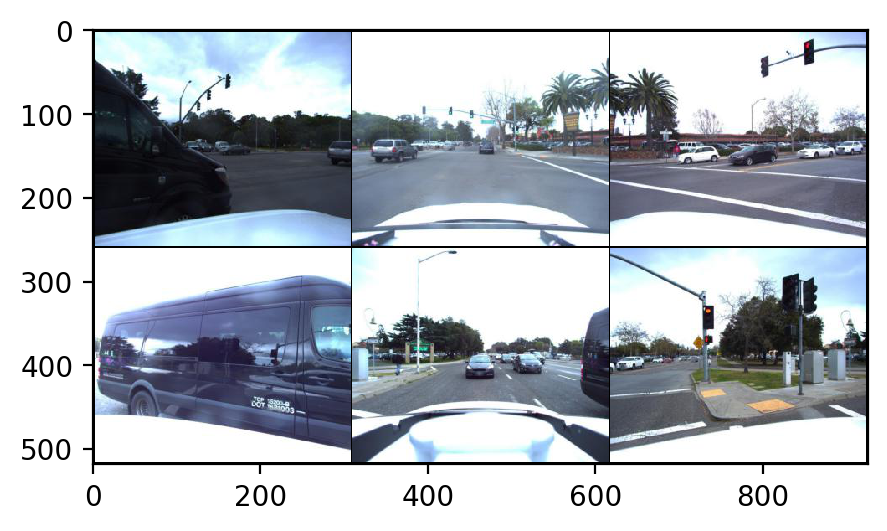

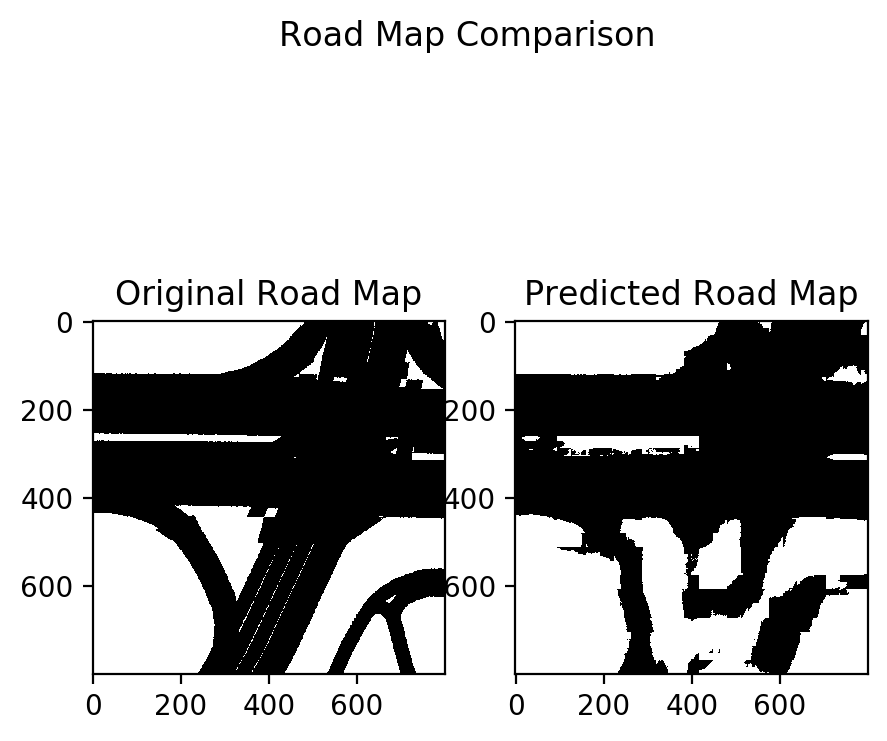

--------------------
Test Batch: 0


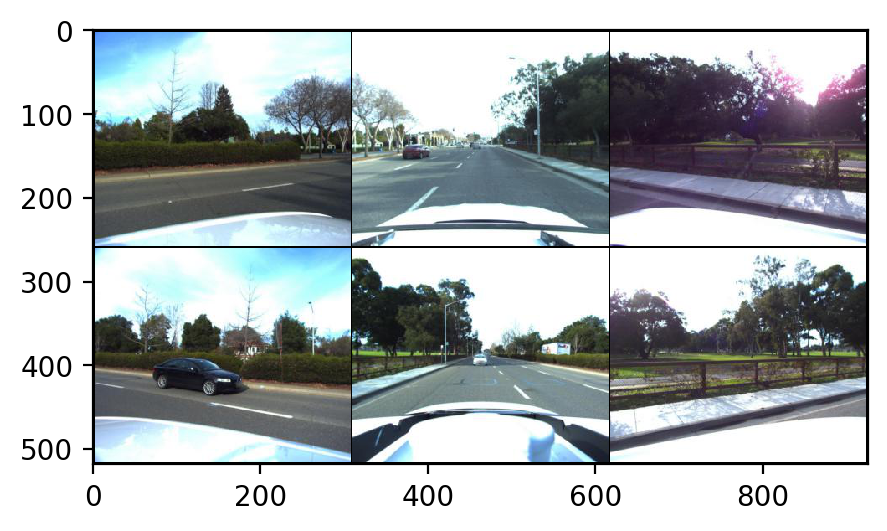

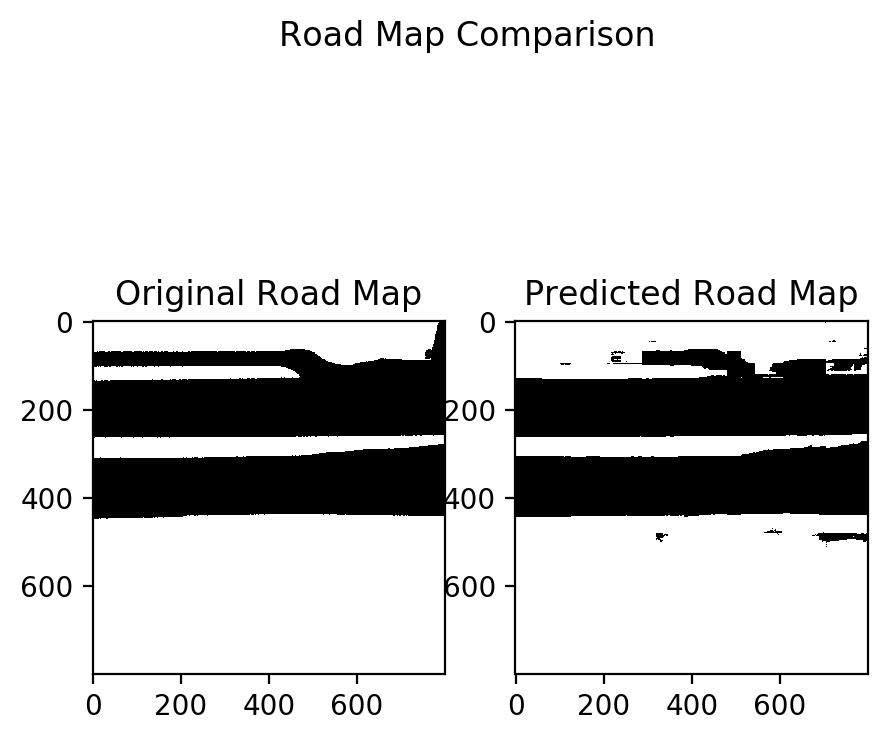

--------------------
Test Batch: 0


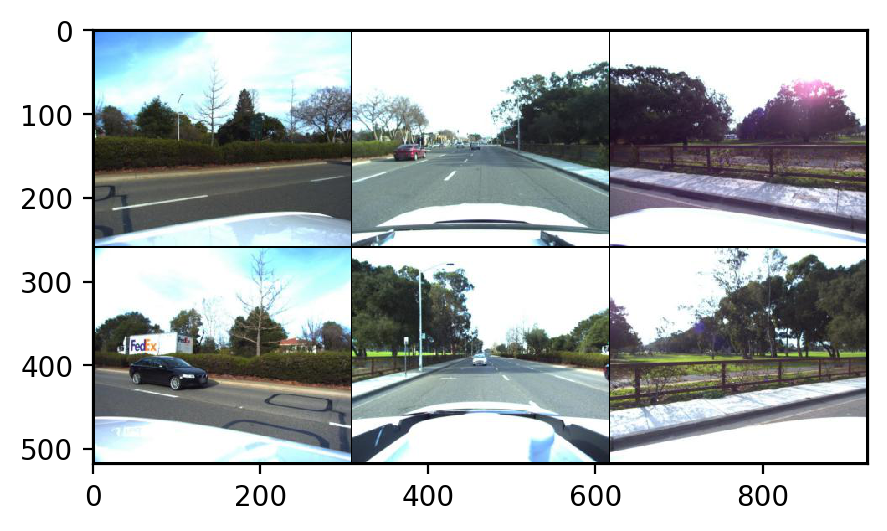

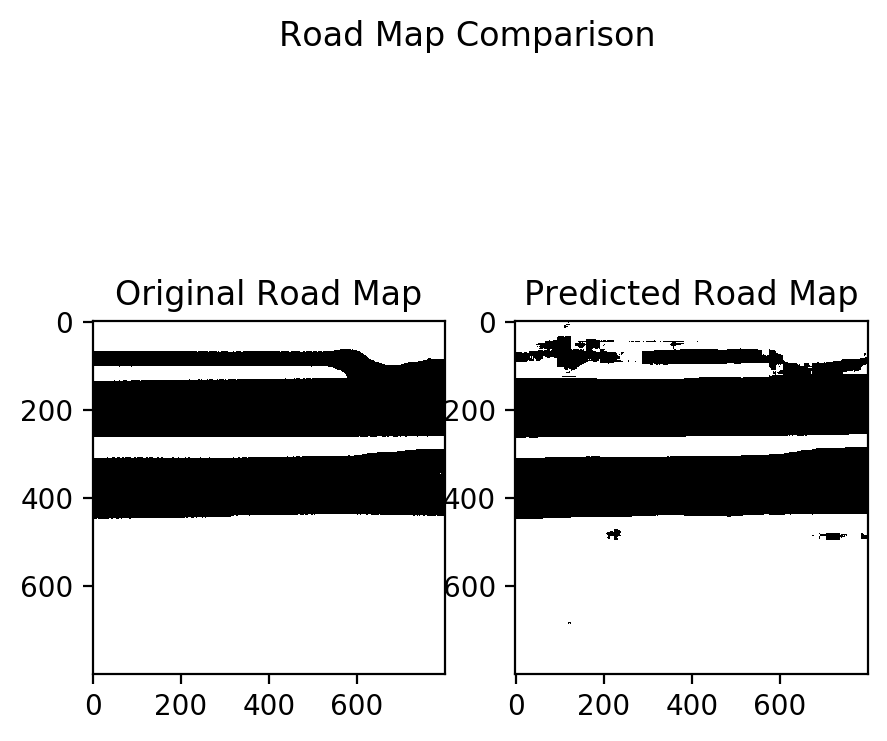

--------------------
Test Batch: 0


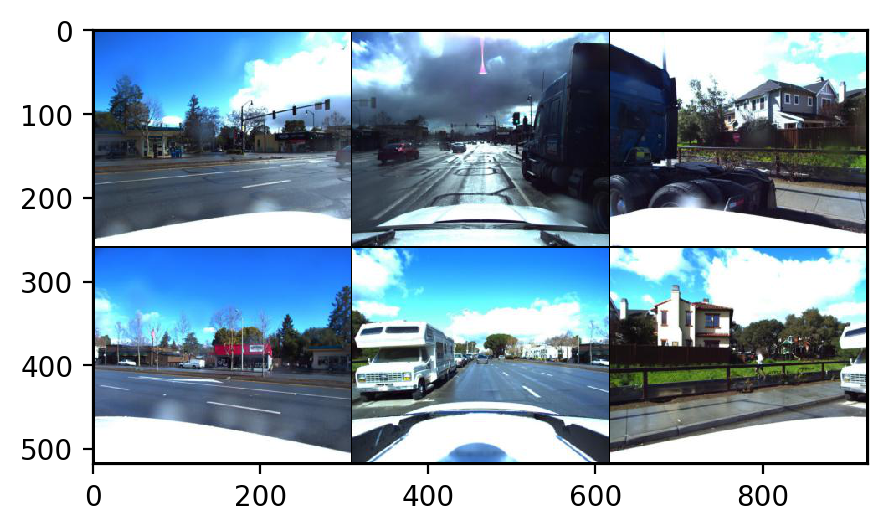

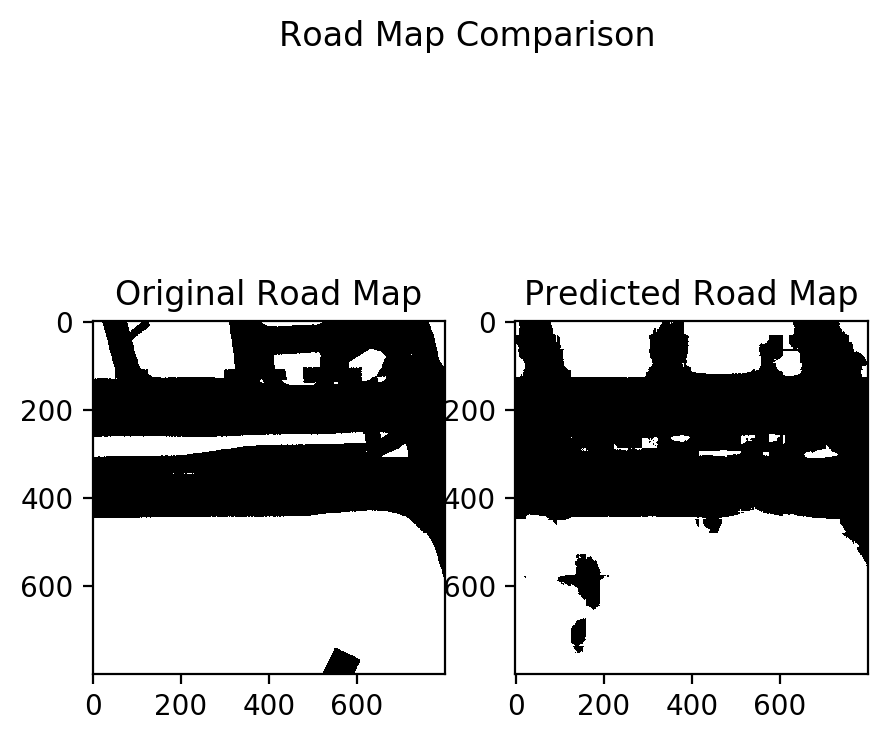

--------------------
Test Batch: 0


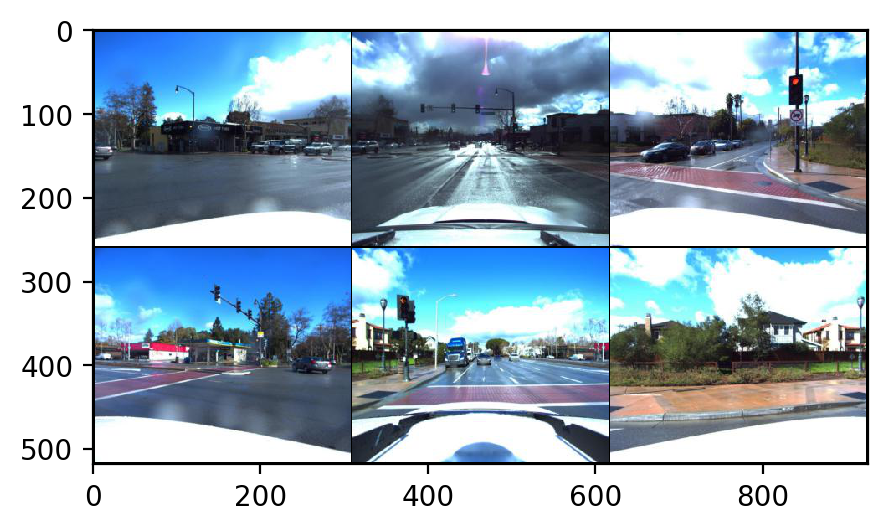

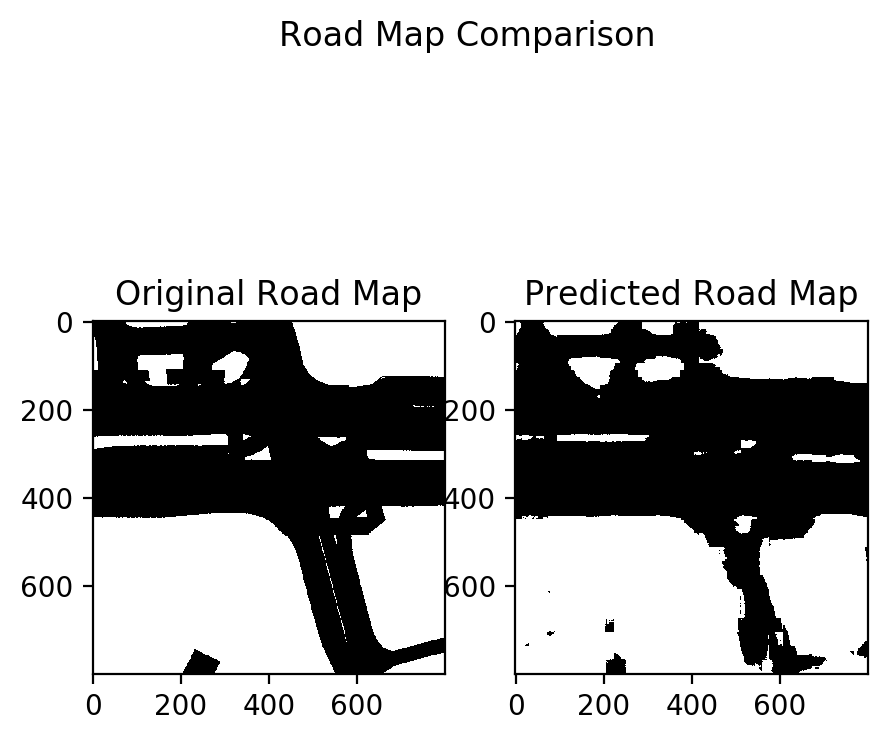

--------------------
Test Batch: 0


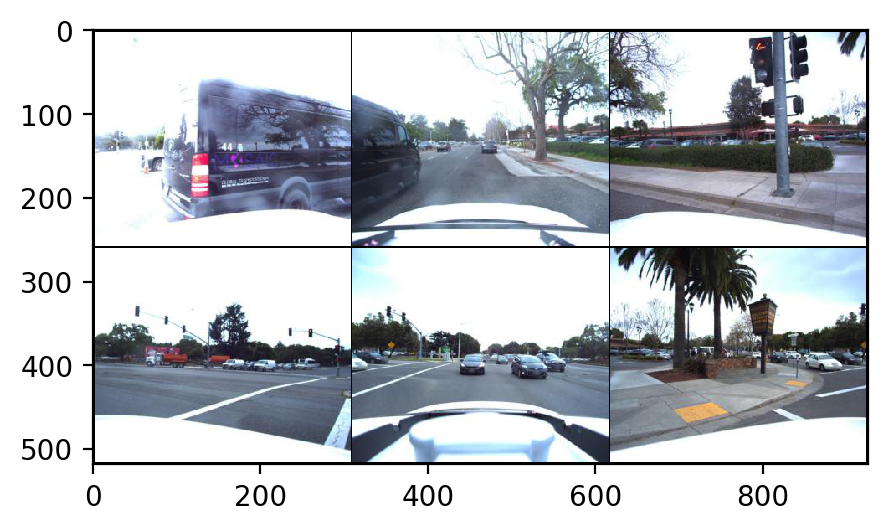

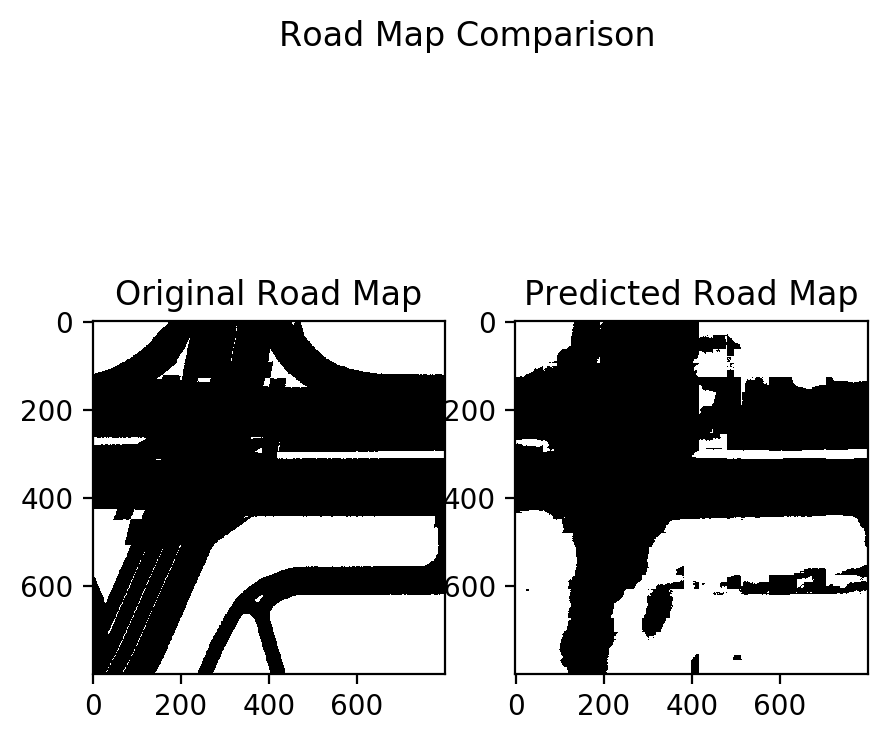

--------------------
Test Batch: 0


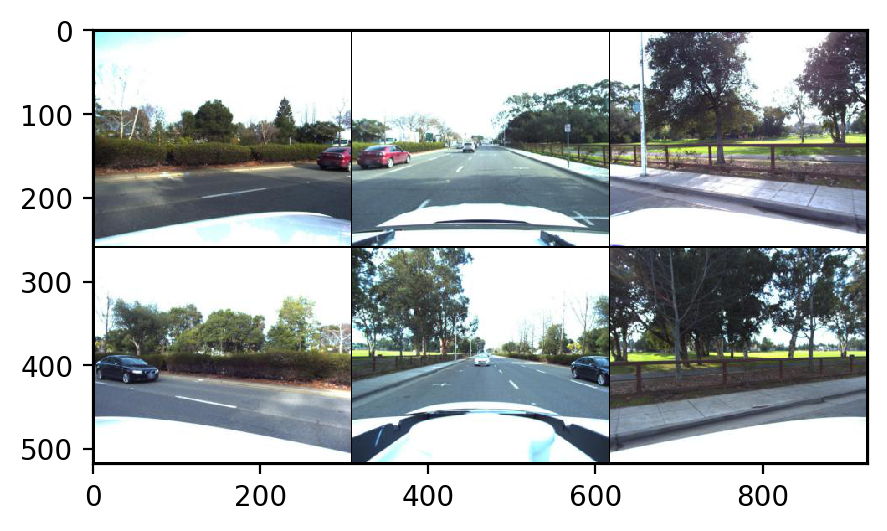

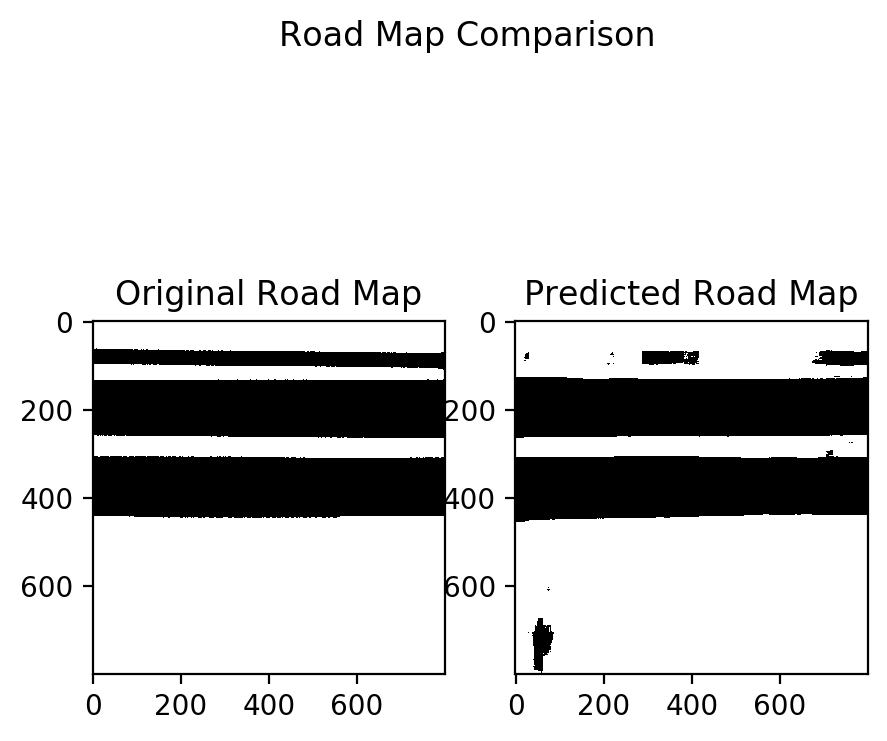

--------------------
Total samples: 16.0, Total Threat Score: 13.629091262817383
Mean Threat Score is: 0.8518182039260864


In [28]:
evaluate(model, model_type, best_checkpoint_path, dataloaders,  'val', display_images = True , n_batch_to_display = 1, threshold = 0.5)


### Measure performance of all models trained so far

In [85]:
# trained_best_models_list = ['ae_checkpoint25-4-res50-random_best.pth.tar'
# ,'ae_checkpoint4-24-res18-random_best.pth.tar'
# ,'ae_checkpoint_6img_132_p100_best.pth.tar'
# ,'checkpoint_25-4_Batch:8_Model:ae18random_best.pth.tar'
# ,'vae_checkpoint25-4-res18-random_best.pth.tar'
# ,'vae_checkpoint25-4-res50-random_best.pth.tar'
# ,'vae_checkpoint_6img_132_p100_best.pth.tar'
# ,'vae_checkpoint_random_132_p100_best.pth.tar',
# 'checkpoint_25-4_Batch:16_Model:vae18random_best.pth.tar']

# path_to_checkpoints = '/home/sc6957/dlproject/code/checkpoints/'

In [26]:
# current_checkpoint_folder = '/scratch/sc6957/dlproject/checkpoints/'
# old_checkpoint_folder = '/scratch/sc6957/dlproject/old_checkpoints/'

# current_trained_best_models_list = ['']

# old_trained_best_models_list = ['ae_checkpoint25-4-res50-random_best.pth.tar'
# ,'ae_checkpoint4-24-res18-random_best.pth.tar'
# ,'ae_checkpoint_6img_132_p100_best.pth.tar'
# ,'checkpoint_25-4_Batch:8_Model:ae18random_best.pth.tar'
# ,'vae_checkpoint25-4-res18-random_best.pth.tar'
# ,'vae_checkpoint25-4-res50-random_best.pth.tar'
# ,'vae_checkpoint_6img_132_p100_best.pth.tar'
# ,'vae_checkpoint_random_132_p100_best.pth.tar',
# 'checkpoint_25-4_Batch:16_Model:vae18random_best.pth.tar']

# trained_best_models_list = old_trained_best_models_list
# path_to_checkpoints = old_checkpoint_folder

# start_ind = 0
# end_ind = len(old_trained_best_models_list)

In [27]:
# for name in trained_best_models_list[start_ind:end_ind]:
#     current_model_path = path_to_checkpoints + name
    
#     resnet_style = '18'
#     if '50' in current_model_path:
#         resnet_style = '50'
    
#     model_type = 'ae'
#     if 'vae' in current_model_path:
#         model_type = 'vae'
    
#     print(current_model_path)
#     print('Creating model with Resnet Style: {0}, Model Type: {1}'.format(resnet_style,model_type))

#     if model_type == 'ae':
#         model = autoencoder(resnet_style=resnet_style,pretrained=False)
#     elif model_type == 'vae':
#         model = vae(resnet_style=resnet_style,pretrained=False)
    
#     model = model.to(device)
#     print('-------')
#     evaluate(model, model_type, current_model_path, dataloaders,  'test', display_images = False)
#     evaluate(model, model_type, current_model_path, dataloaders,  'val', display_images = False)
#     print('-------'*4)

### Unlabeled testing

In [19]:
unlabeled_scene_index = np.arange(106)
#test_unlabeled_scene_index = np.arange(1,3)

unlabeled_set = UnlabeledDataset(image_folder=image_folder, scene_index=unlabeled_scene_index, first_dim='sample', transform=transform)
unlabeled_loader = torch.utils.data.DataLoader(unlabeled_set, batch_size=3, shuffle=True, num_workers=4)
dataloaders.update({'unlabeled':unlabeled_loader})

In [23]:
def evaluate_unlabeled(model, model_type, model_path, phase, display_images = False, n_batch_to_display = 3, threshold = 0.5):
    assert phase == 'unlabeled'
    print('Estimating performance on {} set'.format(phase))
    print('Restoring Best checkpoint from {}'.format(model_path))
    state = torch.load(model_path)
    epoch = state['epoch']
    model.load_state_dict(state['state_dict'])
    
    model.eval()

    total = 0.0
    for i, temp_batch in enumerate(dataloaders[phase]):
        if display_images and i == n_batch_to_display:
            break
        total += len(temp_batch)
        samples = temp_batch.to(device)
        if model_type == 'ae':
            pred_maps = model(samples)
        elif model_type == 'vae':
            z, pred_maps = model(samples)


        if display_images:
            print('Test Batch: {}'.format(i))
            for sample,pred_map in zip(samples,pred_maps):
                # CAM_FRONT_LEFT, CAM_FRONT, CAM_FRONT_RIGHT, CAM_BACK_LEFT, CAM_BACK, CAM_BACK_RIGHT
                plt.imshow(torchvision.utils.make_grid(sample.detach().cpu(), nrow=3).numpy().transpose(1, 2, 0))
                fig, ax = plt.subplots(1, 1)
                ax.imshow((pred_map > threshold).detach().cpu(), cmap='binary');
                ax.set_title('Predicted Road Map')
                plt.show()
                print('-'*20)
                
    print('Total samples: {}'.format(total))

In [22]:
best_checkpoint_path = '/scratch/sc6957/dlproject/checkpoints/checkpoint_26-4_Batch:16_Model:vae18random_dataV3_best.pth.tar'

In [24]:
best_checkpoint_path = '/scratch/sc6957/dlproject/checkpoints/checkpoint_1-5_Batch:16_Model:vae18random_dataV3_leakyrelu_best.pth.tar'

Estimating performance on unlabeled set
Restoring Best checkpoint from /scratch/sc6957/dlproject/checkpoints/checkpoint_1-5_Batch:16_Model:vae18random_dataV3_leakyrelu_best.pth.tar
Test Batch: 0


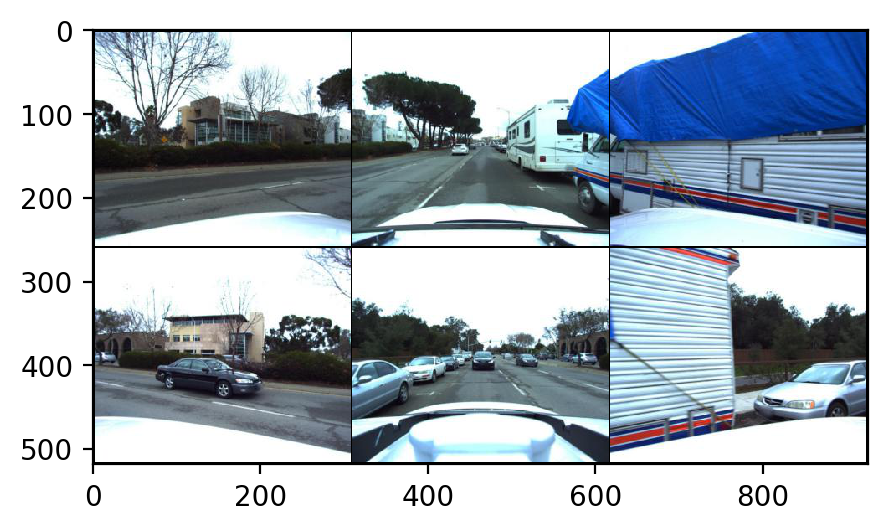

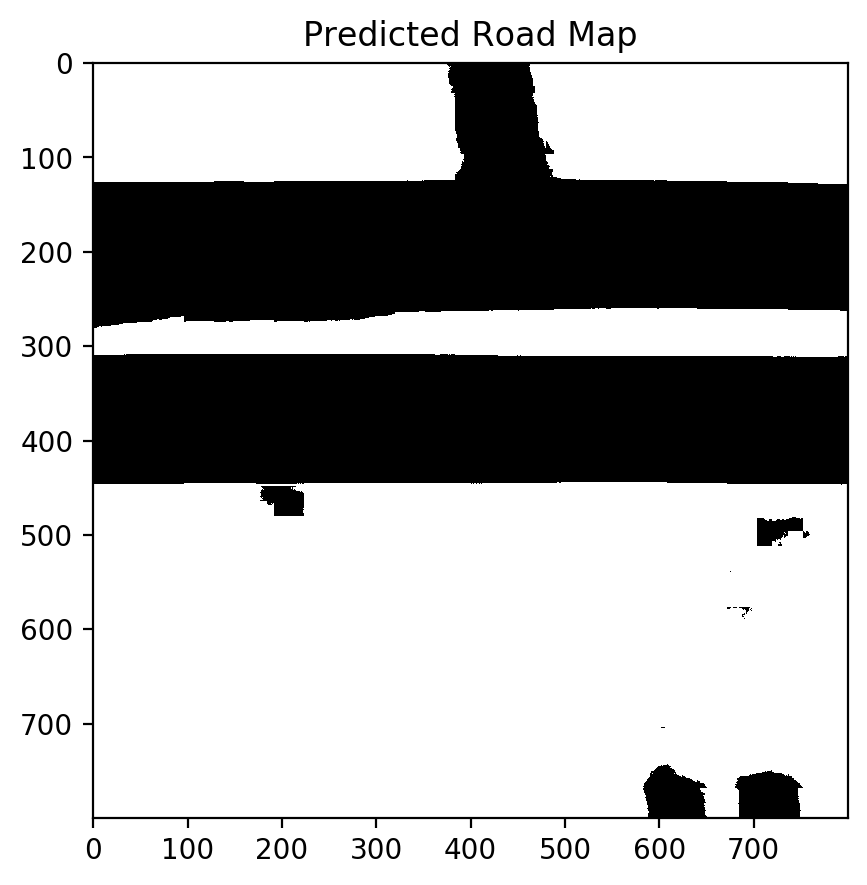

--------------------


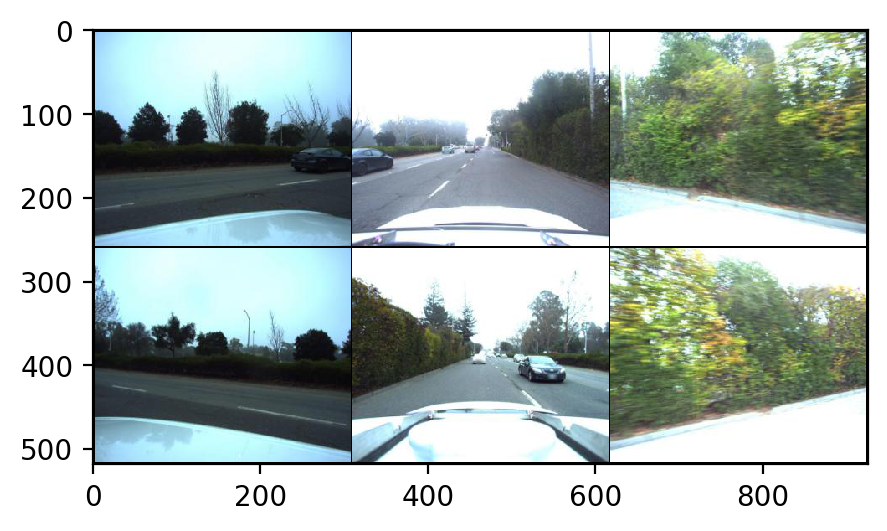

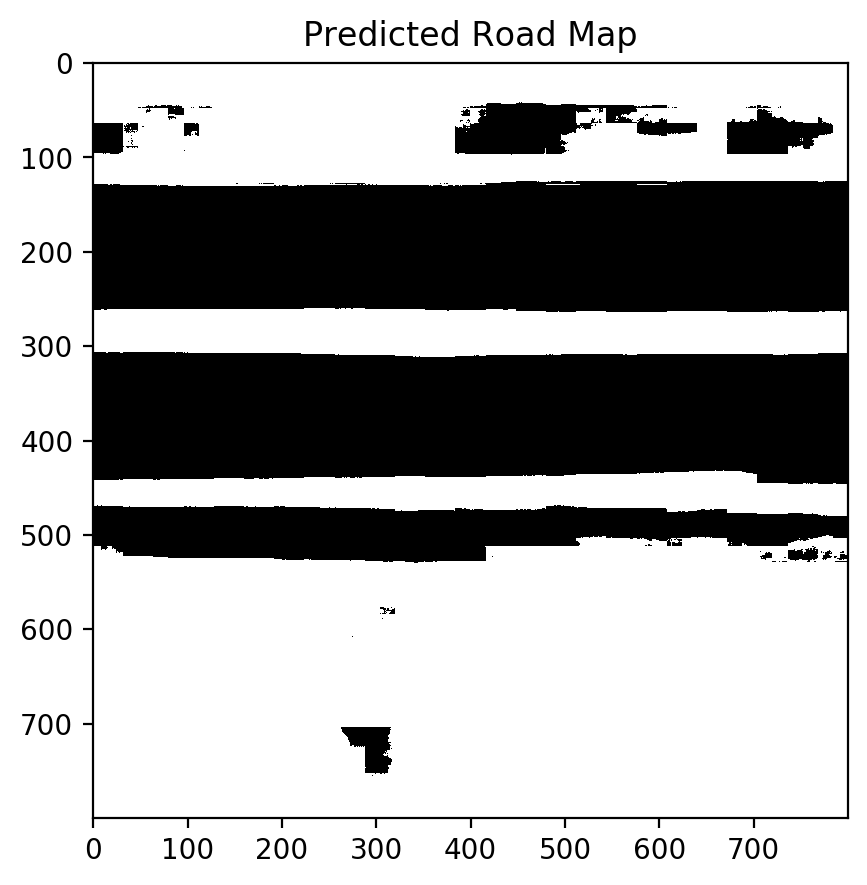

--------------------


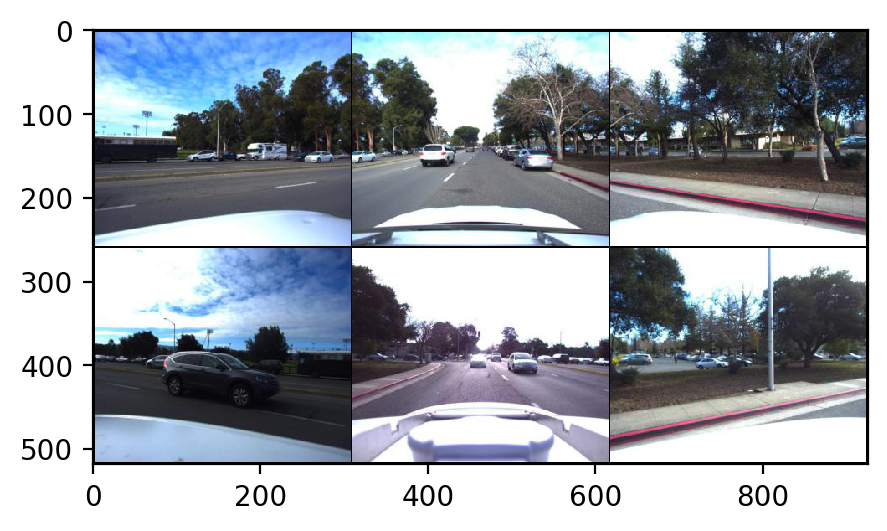

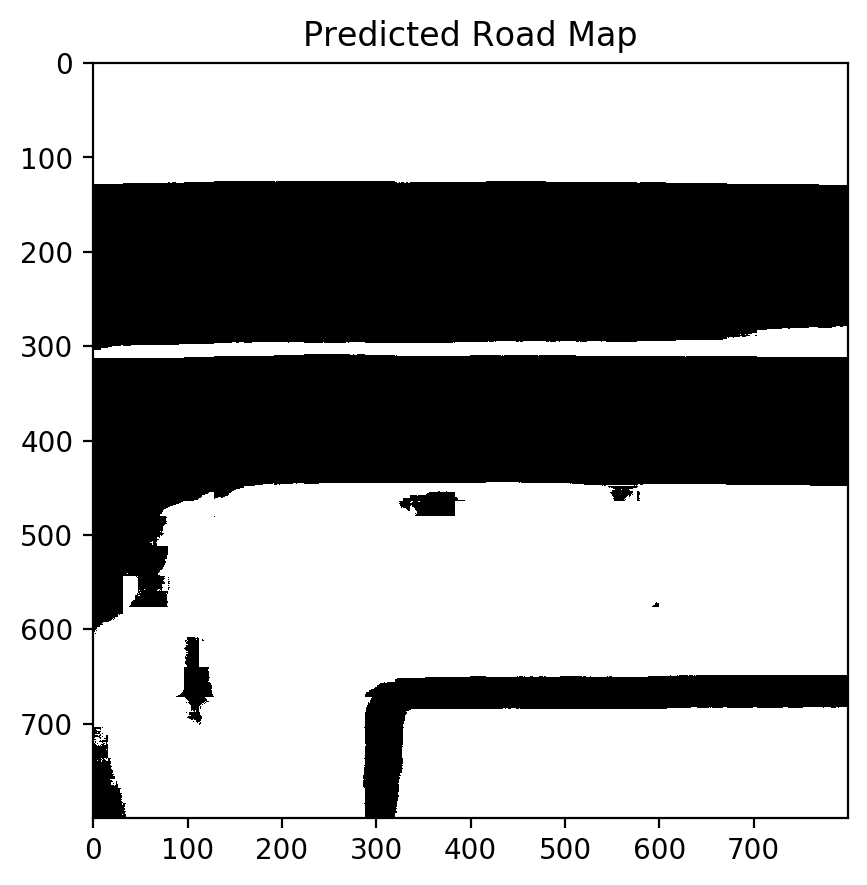

--------------------
Total samples: 3.0


In [25]:
evaluate_unlabeled(model, model_type, best_checkpoint_path, 'unlabeled', \
                   display_images = True , n_batch_to_display = 1, threshold = 0.4)